# What is about ?

EDA for Kaggle competition: Multimodal Single-Cell Integration Competition

(c) Alexander Chervov

Work in progress. We will move towards standard ( +- variations)  bionformatics analysis for single cell data. 

(For single cell RNA sequencing part - see e.g. several Scanpy tutorials: 
https://scanpy.readthedocs.io/en/stable/tutorials.html , some of them can be found on Kaggle: 
https://www.kaggle.com/datasets/alexandervc/scanpy-python-package-for-scrnaseq-analysis .
If you are "R"-user - google for "Seurat") 

#### Versions:

#### 2,3,4,5 cosmetic changes

#### 1 CiteSeq targets analysis

Look on only CiteSeq targets: Proteomics  (cell surface protein markers labeled mainly CD**). CD means "Cluster of Differentiation" - see https://en.wikipedia.org/wiki/Cluster_of_differentiation . 
As expected we see many of them quite correlate with the cell types. 

Some correlated targets are: ['CD71' ,'CD115', 'CD88'] and ['CD155', 'CD112', 'CD47', 'HLA-A-B-C', 'CD45RA', 'CD31', 'CD11a', 'CD13', 'CD29',   'CD81', 'CD18', 'CD45', 'CD49d', 'CD162']


#  Install/Import packages



In [76]:
#If you see a urllib warning running this cell, go to "Settings" on the right hand side, 
#and turn on internet. Note, you need to be phone verified.
!pip install --quiet tables

In [77]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### 1.2. Set filepaths

In [78]:
os.listdir("/kaggle/input/open-problems-multimodal/")

['sample_submission.csv',
 'train_cite_targets.h5',
 'test_multi_inputs.h5',
 'evaluation_ids.csv',
 'train_cite_inputs.h5',
 'train_multi_targets.h5',
 'train_multi_inputs.h5',
 'metadata.csv',
 'test_cite_inputs.h5']

In [79]:
DATA_DIR = "/kaggle/input/open-problems-multimodal/"
FP_CELL_METADATA = os.path.join(DATA_DIR,"metadata.csv")

FP_CITE_TRAIN_INPUTS = os.path.join(DATA_DIR,"train_cite_inputs.h5")
FP_CITE_TRAIN_TARGETS = os.path.join(DATA_DIR,"train_cite_targets.h5")
FP_CITE_TEST_INPUTS = os.path.join(DATA_DIR,"test_cite_inputs.h5")

FP_MULTIOME_TRAIN_INPUTS = os.path.join(DATA_DIR,"train_multi_inputs.h5")
FP_MULTIOME_TRAIN_TARGETS = os.path.join(DATA_DIR,"train_multi_targets.h5")
FP_MULTIOME_TEST_INPUTS = os.path.join(DATA_DIR,"test_multi_inputs.h5")

FP_SUBMISSION = os.path.join(DATA_DIR,"sample_submission.csv")
FP_EVALUATION_IDS = os.path.join(DATA_DIR,"evaluation_ids.csv")

## Load Data

In [102]:
%%time
df_cite_train_y = pd.read_hdf('../input/open-problems-multimodal/train_cite_targets.h5')
print(df_cell['cell_type'].value_counts())
df_cite_train_y.head()

df_cell = pd.read_csv(FP_CELL_METADATA, index_col = 0)
d = df_cell.join(df_cite_train_y, how = 'right')#.join()
print(d.shape, df_cite_train_y.shape )



HSC       77535
hidden    55935
NeuP      42979
EryP      41479
MasP      34827
MkP       24021
MoP        3883
BP          869
Name: cell_type, dtype: int64
(70988, 144) (70988, 140)
CPU times: user 633 ms, sys: 77.1 ms, total: 710 ms
Wall time: 1.28 s


### Cell types: 

    MasP = Mast Cell Progenitor
    MkP = Megakaryocyte Progenitor
    NeuP = Neutrophil Progenitor
    MoP = Monocyte Progenitor
    EryP = Erythrocyte Progenitor
    HSC = Hematoploetic Stem Cell
    BP = B-Cell Progenitor

# Dimensional reduction with PCA

In [81]:
X = df_cite_train_y.values
list_X_column_names = list(df_cite_train_y.columns)


3.0140368938446045 secs passed for PCA


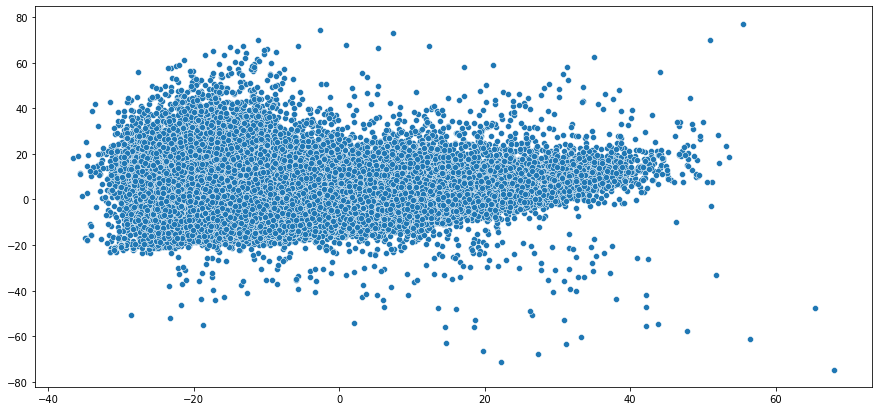

Text(0.5, 1.0, 'explained variance')

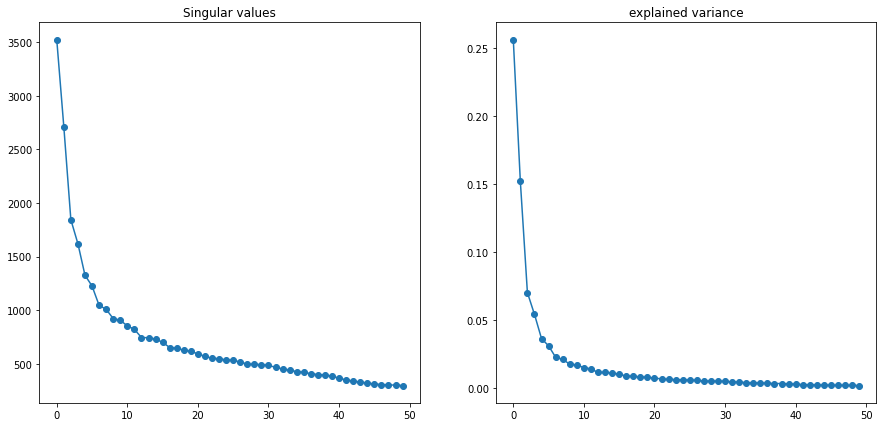

In [82]:

from sklearn.decomposition import PCA
import time 
import matplotlib.pyplot as plt
import seaborn as sns

pca = PCA(n_components=50)
t0 = time.time()
r = pca.fit_transform(X)
print(time.time()-t0, 'secs passed for PCA')

fig = plt.figure(figsize = (15,7) )
c = 0
# for f in ['cp_dose', 'cp_type','cp_time', 'y_sum']:
#     c+=1; fig.add_subplot(1, 4 , c) 
sns.scatterplot(x=r[:,0], y=r[:,1])# , hue = df[f]  )
#    plt.title('Colored by '+f)
plt.show()

fig = plt.figure(figsize = (15,7) )
fig.add_subplot(1, 2, 1) 
plt.plot(pca.singular_values_,'o-')
plt.title('Singular values')
fig.add_subplot(1, 2, 2) 
plt.plot(pca.explained_variance_ratio_,'o-')
plt.title('explained variance')


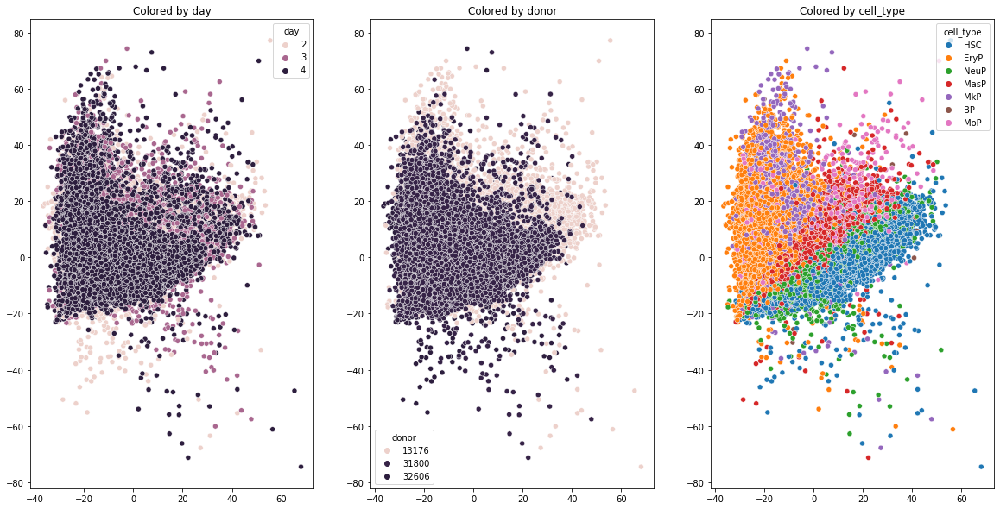

In [84]:
fig = plt.figure(figsize = (20,10) )
c = 0
for f in ['day', 'donor', 'cell_type']:# , 'technology']:
    c+=1; fig.add_subplot(1, 3 , c) 
    sns.scatterplot(x=r[:,0], y=r[:,1] , hue = d[f]  )
    plt.title('Colored by '+f)
plt.show()


# Correlation analysis

0.15940523147583008 seconds passed
-0.4203366934730965 minimal correlation
0.1459795076935837 average absolute correlation
0.11385831744231611 median absolute correlation
5.174370168695091e-05 min absolute correlation
0.1319635864071325 std absolute correlation


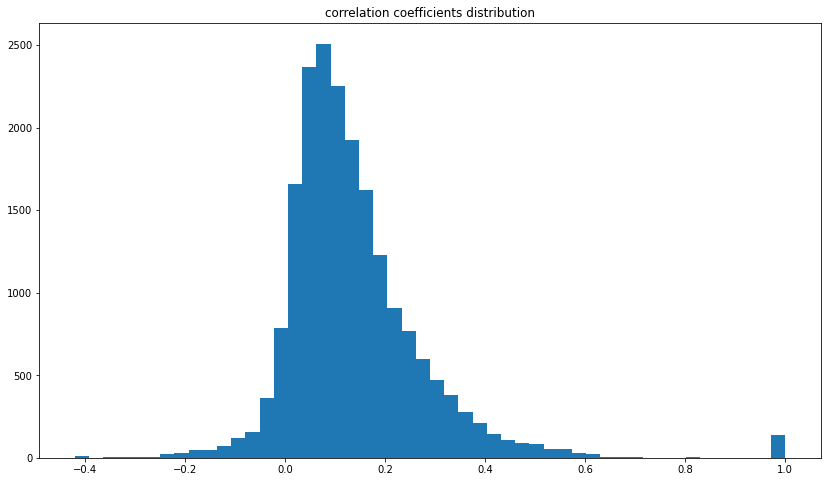

0.4180281162261963 seconds passed


(19600,)

In [85]:
t0 = time.time()
corr_matr = np.corrcoef(X.T) # Hint - use numpy , pandas is MUCH SLOWER   (df.corr() )
print(time.time() - t0, 'seconds passed')
print(np.min(corr_matr ), 'minimal correlation' )
corr_matr_abs = np.abs( corr_matr )
print(np.mean(corr_matr_abs ), 'average absolute correlation' )
print(np.median(corr_matr_abs), 'median absolute correlation' )
print(np.min(corr_matr_abs ), 'min absolute correlation' )
print(np.std(corr_matr_abs ), 'std absolute correlation' )

v = corr_matr.flatten()
plt.figure(figsize=(14,8))
t0 = time.time()
plt.hist(v, bins = 50)
plt.title('correlation coefficients distribution')
plt.show()
print(time.time() - t0, 'seconds passed')


v.shape

/opt/conda/lib/python3.7/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


0.7  seconds passed.


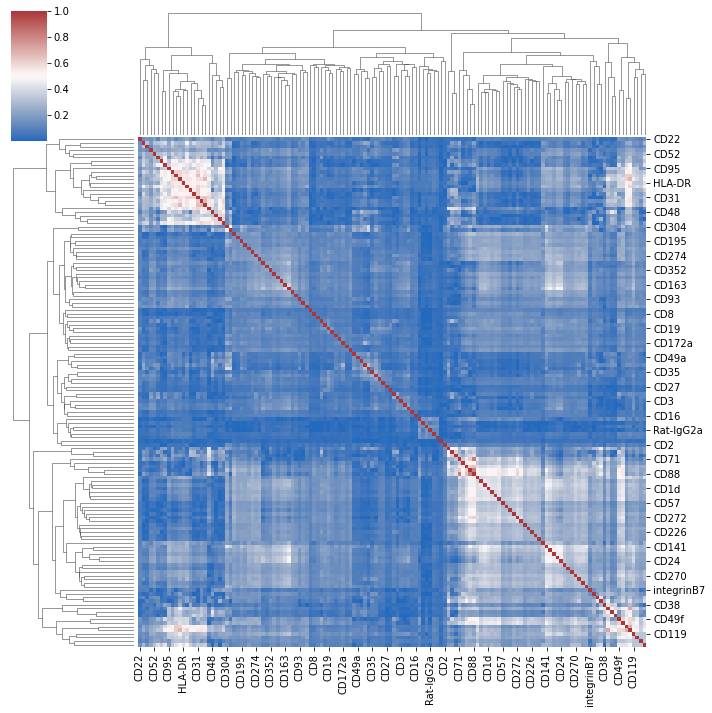

In [86]:
df_corr_matr = pd.DataFrame(corr_matr, index = list_X_column_names, columns = list_X_column_names )

#clustermap
import seaborn as sns
t0 = time.time()
sns.clustermap(np.abs(df_corr_matr),cmap='vlag');
print( np.round(time.time()- t0,1), ' seconds passed.')

In [87]:
import igraph


In [88]:
verbose = 0
df_stat = pd.DataFrame() # dict_save_largest_component_size = {} 
i = 0
for correlation_threshold in [0.8, 0.7, 0.6, 0.5, 0.4] :
    t0 = time.time()
    print()
    print(correlation_threshold , 'correlation_threshold ')
    corr_matr_abs_bool = corr_matr_abs > correlation_threshold
    corr_matr_abs_bool = corr_matr_abs_bool # Restrict to  genes part 
    corr_matr_abs_bool = np.triu(corr_matr_abs_bool,1) # Take upper triangular part 
    g = igraph.Graph().Adjacency(corr_matr_abs_bool.tolist())
    g.to_undirected(mode = 'collapse')
    if verbose >= 10:
        print( corr_matr_abs_bool.astype(int) )
        print('Number of nodes ', g.vcount())
        print('Number of edges ', g.ecount() )
        print('Number of weakly connected compoenents', len( g.clusters(mode='WEAK')))


    list_clusters_nodes_lists = list( g.clusters(mode='WEAK') )
    list_clusers_size = [len(t) for t in list_clusters_nodes_lists ]
    list_clusers_size = np.sort(list_clusers_size)[::-1]
    print('Top 5 cluster sizes:', list_clusers_size[:5] , 'seconds passed:', np.round(time.time()-t0 , 2))
    #dict_save_largest_component_size[correlation_threshold ] = list_clusers_size[0]
    for t  in list_clusters_nodes_lists:
        if len(t) == list_clusers_size[0]:
            print('50 Genes in largest correlated group:')
            print(np.array(list_X_column_names)[t[:50]])
    i += 1
    df_stat.loc[i,'correlation threshold'] = correlation_threshold
    df_stat.loc[i,'Largest Component Size'] = list_clusers_size[0]
    df_stat.loc[i,'Second Component Size'] = list_clusers_size[1]
    
df_stat


0.8 correlation_threshold 
Top 5 cluster sizes: [3 1 1 1 1] seconds passed: 0.0
50 Genes in largest correlated group:
['CD71' 'CD115' 'CD88']

0.7 correlation_threshold 
Top 5 cluster sizes: [3 2 1 1 1] seconds passed: 0.0
50 Genes in largest correlated group:
['CD71' 'CD115' 'CD88']

0.6 correlation_threshold 
Top 5 cluster sizes: [14  5  2  1  1] seconds passed: 0.0
50 Genes in largest correlated group:
['CD155' 'CD112' 'CD47' 'HLA-A-B-C' 'CD45RA' 'CD31' 'CD11a' 'CD13' 'CD29'
 'CD81' 'CD18' 'CD45' 'CD49d' 'CD162']

0.5 correlation_threshold 
Top 5 cluster sizes: [39  4  2  1  1] seconds passed: 0.0
50 Genes in largest correlated group:
['CD155' 'CD112' 'CD47' 'CD48' 'CD33' 'HLA-A-B-C' 'CD45RA' 'CD123' 'CD49f'
 'CD44' 'CD31' 'Podoplanin' 'CD32' 'CD62L' 'CD107a' 'CD95' 'HLA-DR' 'CD1d'
 'CD272' 'CD58' 'CD11a' 'CD244' 'FceRIa' 'CD137' 'CD13' 'CD29' 'CD49b'
 'CD81' 'CD18' 'CD45' 'CD71' 'CD26' 'CD115' 'CD63' 'CD49d' 'CD162' 'CD85j'
 'CD88' 'CD224']

0.4 correlation_threshold 
Top 5 cluste

,correlation threshold,Largest Component Size,Second Component Size
1,0.8,3.0,1.0
2,0.7,3.0,2.0
3,0.6,14.0,5.0
4,0.5,39.0,4.0
5,0.4,71.0,1.0


# Dimensional reduction with UMAP

58.50090575218201 secs passed for umap


<AxesSubplot:>

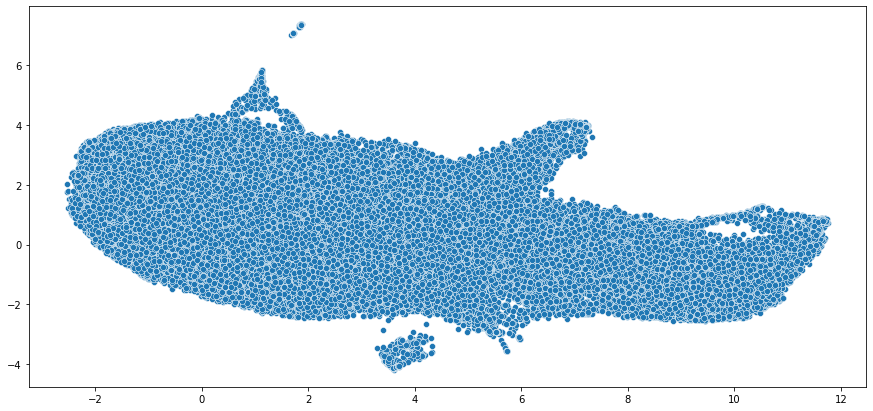

In [89]:
import umap

t0 = time.time()
r = umap.UMAP().fit_transform(X)
print(time.time()-t0, 'secs passed for umap')


fig = plt.figure(figsize = (15,7) )
# c = 0
# for f in ['cp_dose', 'cp_type','cp_time','y_sum']:
#     c+=1; fig.add_subplot(1, 4 , c) 
sns.scatterplot(x=r[:,0], y=r[:,1])#  , hue = df[f]  )
# plt.show()

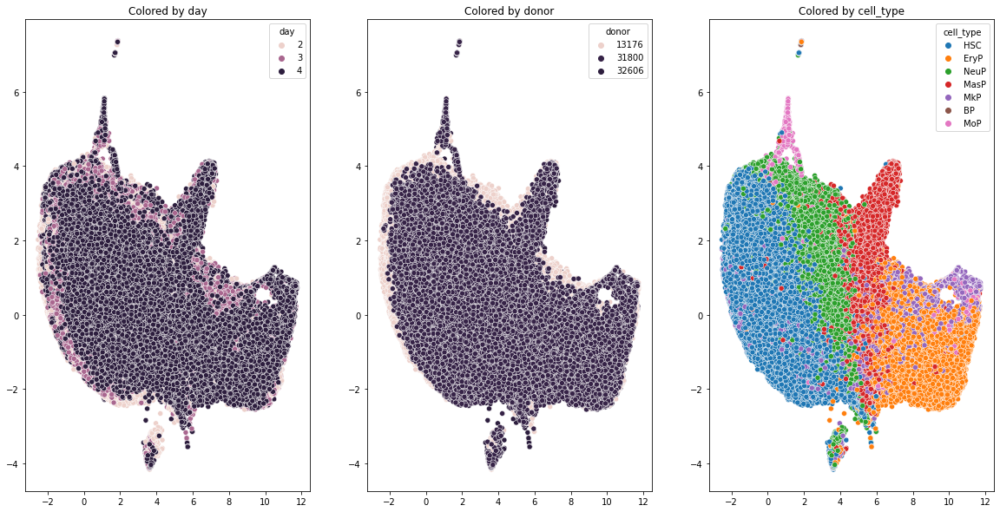

In [90]:
fig = plt.figure(figsize = (20,10) )
c = 0
for f in ['day', 'donor', 'cell_type']:# , 'technology']:
    c+=1; fig.add_subplot(1, 3 , c) 
    sns.scatterplot(x=r[:,0], y=r[:,1] , hue = d[f]  )
    plt.title('Colored by '+f)
plt.show()


    MasP = Mast Cell Progenitor
    MkP = Megakaryocyte Progenitor
    NeuP = Neutrophil Progenitor
    MoP = Monocyte Progenitor
    EryP = Erythrocyte Progenitor
    HSC = Hematoploetic Stem Cell
    BP = B-Cell Progenitor

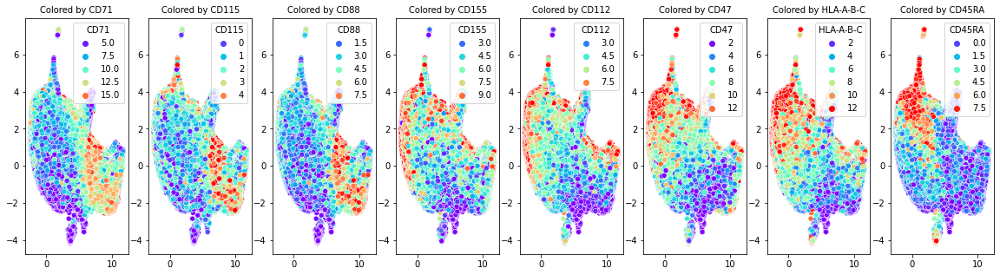

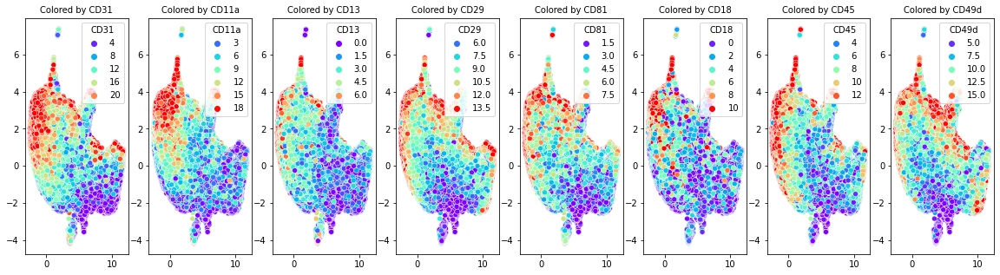

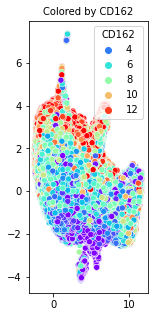

75.63822102546692 secs passed


In [91]:
# 0.7 correlation_threshold 
# Top 5 cluster sizes: [3 2 1 1 1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD71' 'CD115' 'CD88']

# 0.6 correlation_threshold 
# Top 5 cluster sizes: [14  5  2  1  1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD155' 'CD112' 'CD47' 'HLA-A-B-C' 'CD45RA' 'CD31' 'CD11a' 'CD13' 'CD29'
#  'CD81' 'CD18' 'CD45' 'CD49d' 'CD162']

import numbers

n_x_subplots = 8
palette = 'rainbow'#'viridis'

t0 = time.time()

c = 0
for f in ['CD71', 'CD115' ,'CD88'] + ['CD155', 'CD112', 'CD47', 'HLA-A-B-C' ,'CD45RA' ,'CD31' ,'CD11a', 'CD13', 'CD29',
  'CD81', 'CD18', 'CD45', 'CD49d', 'CD162']: # ['day', 'donor', 'cell_type']:# , 'technology']:
    if c % n_x_subplots == 0:
        if c > 0:
            plt.show()
        fig = plt.figure(figsize = (20,5) ); c = 0
        #plt.suptitle(str(k),fontsize = 20 )# str_data_inf + ' n_cells: ' +str(mask.sum()) + ' RED > median expression, BLUE <= median ' )# +' ' + cell_type +' ' + drug )
        
    c += 1; fig.add_subplot(1,n_x_subplots ,c)    
    
    v = d[f]
    if isinstance(v[0], numbers.Number):
        v = np.clip(v,np.percentile(v,5), np.percentile(v,95) )
        # v = (v > np.median(v)).astype(int)
    ax = sns.scatterplot(x=r[:,0], y=r[:,1] , hue =  v , palette = palette )
    plt.setp(ax.get_legend().get_texts(), fontsize=10) # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize=10) # for legend title    
    plt.title('Colored by '+f, fontsize = 10)
    
plt.show()
print(time.time()-t0, 'secs passed')


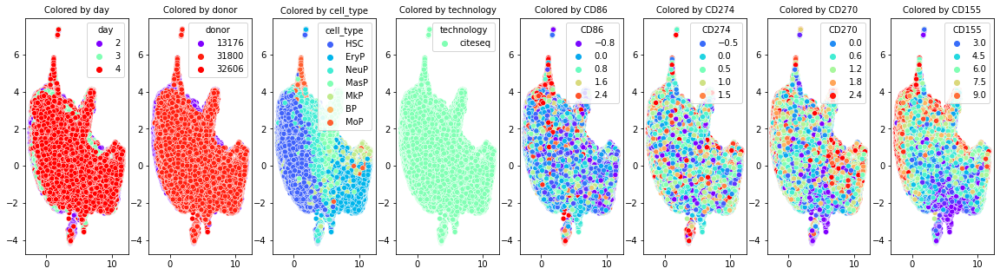

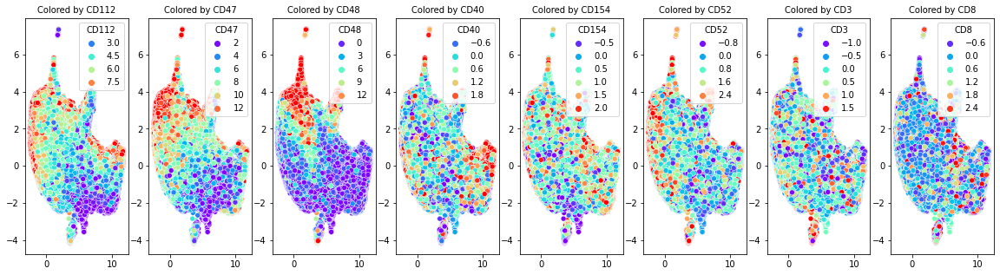

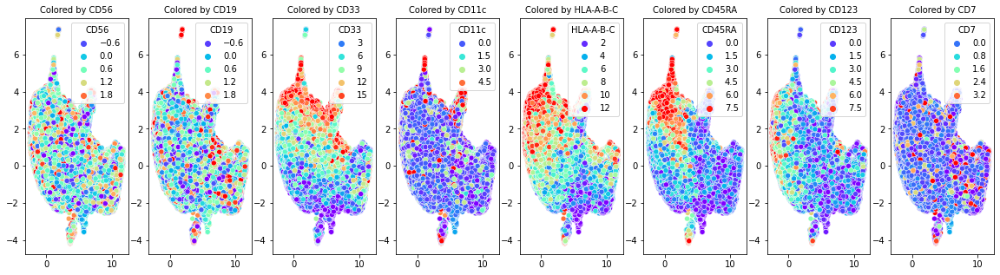

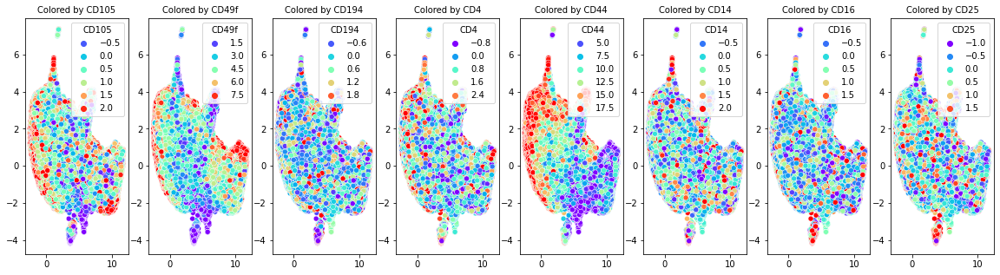

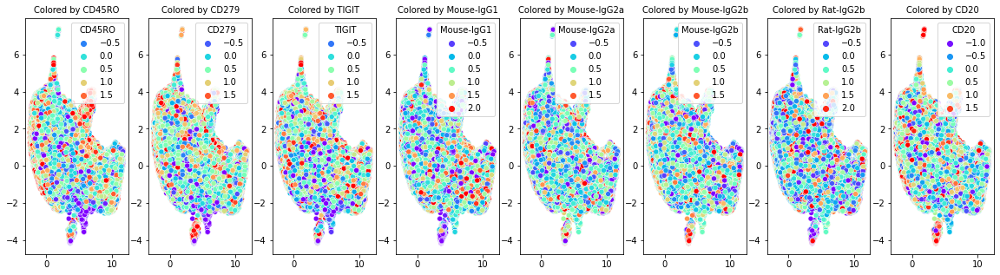

...

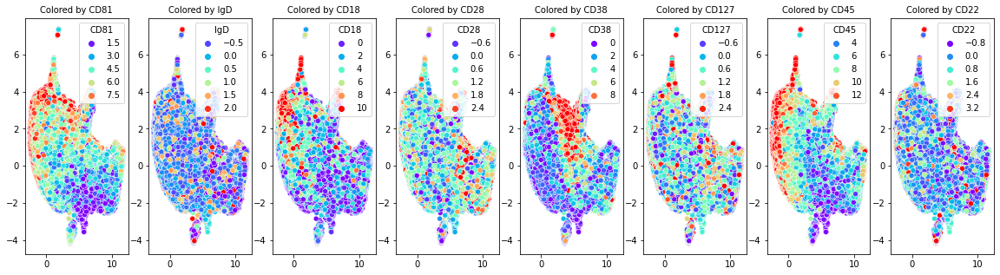

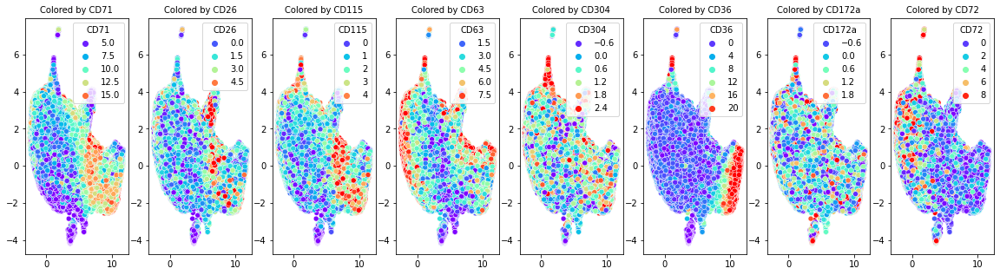

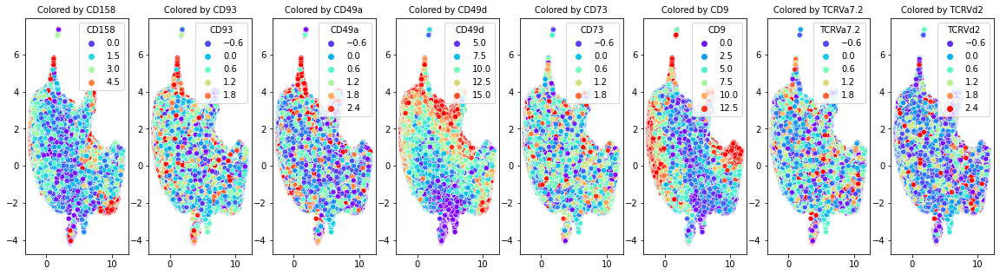

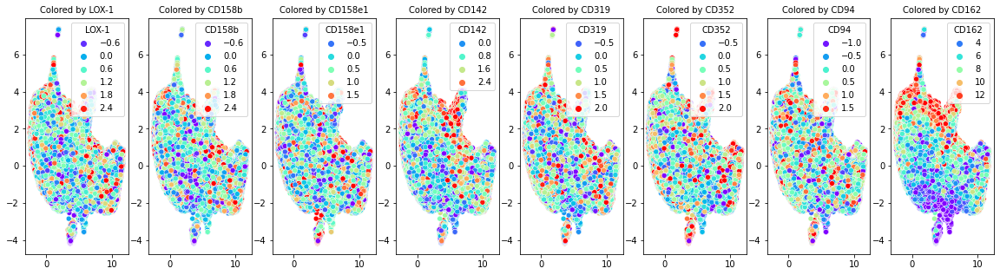

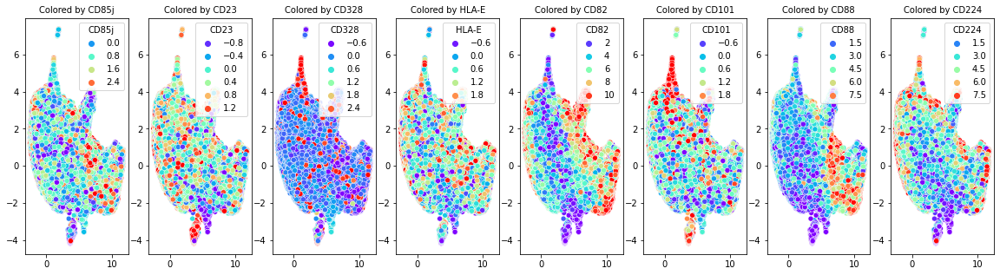

647.1725695133209 secs passed


In [92]:
import numbers

n_x_subplots = 8
palette = 'rainbow'#'viridis'

t0 = time.time()

c = 0
for f in d.columns: # ['day', 'donor', 'cell_type']:# , 'technology']:
    if c % n_x_subplots == 0:
        if c > 0:
            plt.show()
        fig = plt.figure(figsize = (20,5) ); c = 0
        #plt.suptitle(str(k),fontsize = 20 )# str_data_inf + ' n_cells: ' +str(mask.sum()) + ' RED > median expression, BLUE <= median ' )# +' ' + cell_type +' ' + drug )
        
    c += 1; fig.add_subplot(1,n_x_subplots ,c)    
    
    v = d[f]
    if isinstance(v[0], numbers.Number):
        v = np.clip(v,np.percentile(v,5), np.percentile(v,95) )
        # v = (v > np.median(v)).astype(int)
    ax = sns.scatterplot(x=r[:,0], y=r[:,1] , hue =  v , palette = palette )
    plt.setp(ax.get_legend().get_texts(), fontsize=10) # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize=10) # for legend title    
    plt.title('Colored by '+f, fontsize = 10)
    
plt.show()
print(time.time()-t0, 'secs passed')


# Other dimensional reductions (from Sklearn)

PCA: 1 sec
umap: 59 sec
FA: 12 sec
Got Exception NMF
RandProj: 0.044 sec
RandTrees: 5.8 sec


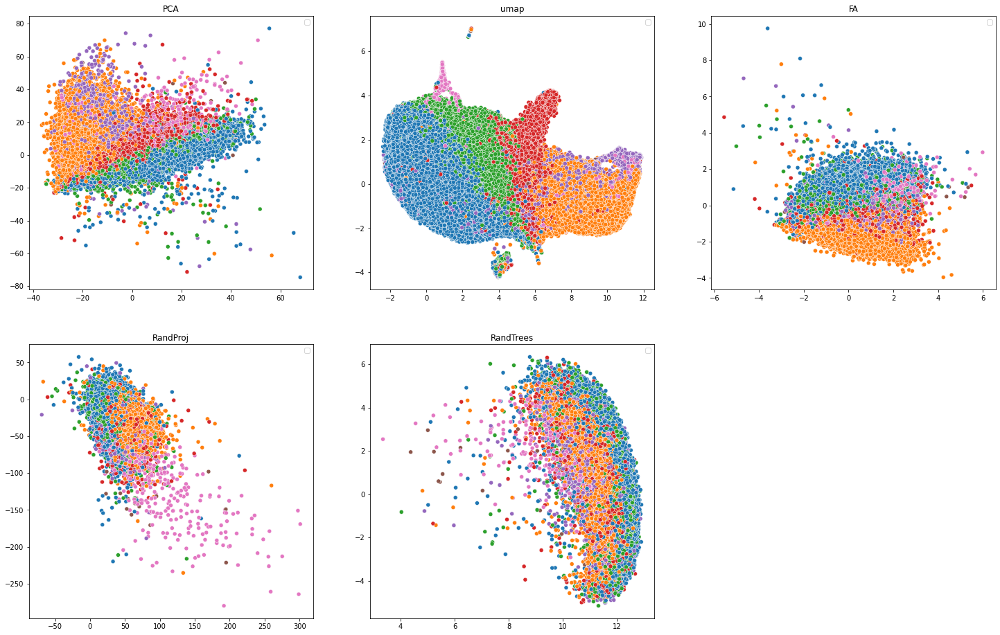

In [93]:
# Based on: 
# https://scikit-learn.org/stable/auto_examples/manifold/plot_compare_methods.html#sphx-glr-auto-examples-manifold-plot-compare-methods-py
# See also:
# https://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html#



# To speed-up reduce dimensions by PCA first
X_save = X.copy( )
#r = pca.fit_transform(X)
#X = r[:1000,:20]



import umap 
from sklearn import manifold
from sklearn.decomposition import PCA
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import NMF
from sklearn.decomposition import FastICA
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.ensemble import RandomTreesEmbedding
from sklearn.random_projection import SparseRandomProjection
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.pipeline import make_pipeline
from sklearn.decomposition import TruncatedSVD


from collections import OrderedDict
from functools import partial
from matplotlib.ticker import NullFormatter


n_neighbors = 10
n_components = 2
# Set-up manifold methods
LLE = partial(manifold.LocallyLinearEmbedding,
              n_neighbors, n_components, eigen_solver='auto')

methods = OrderedDict()
methods['PCA'] = PCA()
methods['umap'] = umap.UMAP(n_components = n_components)
methods['t-SNE'] = manifold.TSNE(n_components=n_components, init='pca', random_state=0)
methods['ICA'] = FastICA(n_components=n_components,         random_state=0)
methods['FA'] = FactorAnalysis(n_components=n_components, random_state=0)
#methods['LLE'] = LLE(method='standard')
#methods['Modified LLE'] = LLE(method='modified')
#methods['Isomap'] = manifold.Isomap(n_neighbors, n_components)
methods['MDS'] = manifold.MDS(n_components, max_iter=100, n_init=1)
methods['SE'] = manifold.SpectralEmbedding(n_components=n_components,
                                           n_neighbors=n_neighbors)
methods['NMF'] = NMF(n_components=n_components,  init='random', random_state=0) 
methods['RandProj'] = SparseRandomProjection(n_components=n_components, random_state=42)

rand_trees_embed = make_pipeline(RandomTreesEmbedding(n_estimators=200, random_state=0, max_depth=5), TruncatedSVD(n_components=n_components) )
methods['RandTrees'] = rand_trees_embed
methods['LatDirAll'] = LatentDirichletAllocation(n_components=n_components,  random_state=0)
#methods['LTSA'] = LLE(method='ltsa') 
#methods['Hessian LLE'] = LLE(method='hessian') 

list_fast_methods = ['PCA','umap','FA', 'NMF','RandProj','RandTrees'] # 'ICA',
list_slow_methods = ['t-SNE','LLE','Modified LLE','Isomap','MDS','SE','LatDirAll','LTSA','Hessian LLE']

# transformer = NeighborhoodComponentsAnalysis(init='random',  n_components=2, random_state=0) # Cannot be applied since supervised - requires y 
# methods['LinDisA'] = LinearDiscriminantAnalysis(n_components=n_components)# Cannot be applied since supervised - requires y 


# Create figure
fig = plt.figure(figsize=(25, 16))

# Plot results
c = 0
for i, (label, method) in enumerate(methods.items()):
    if label not in  list_fast_methods :
        continue
        
    t0 = time.time()
    try:
        r = method.fit_transform(X)
    except:
        print('Got Exception', label )
        continue 
    t1 = time.time()
    print("%s: %.2g sec" % (label, t1 - t0))
    c+=1
    fig.add_subplot(2, 3 , c) 
    sns.scatterplot(x=r[:,0], y=r[:,1] , hue =  d['cell_type'])
    plt.title(label )
    plt.legend('')

plt.show()


# Trimap - yet another anlogue of tsne/umap 

In [94]:
!pip install trimap 
import trimap



In [95]:
column4color = 'cell_type'

95.15081906318665 secs passed for dimension reduction


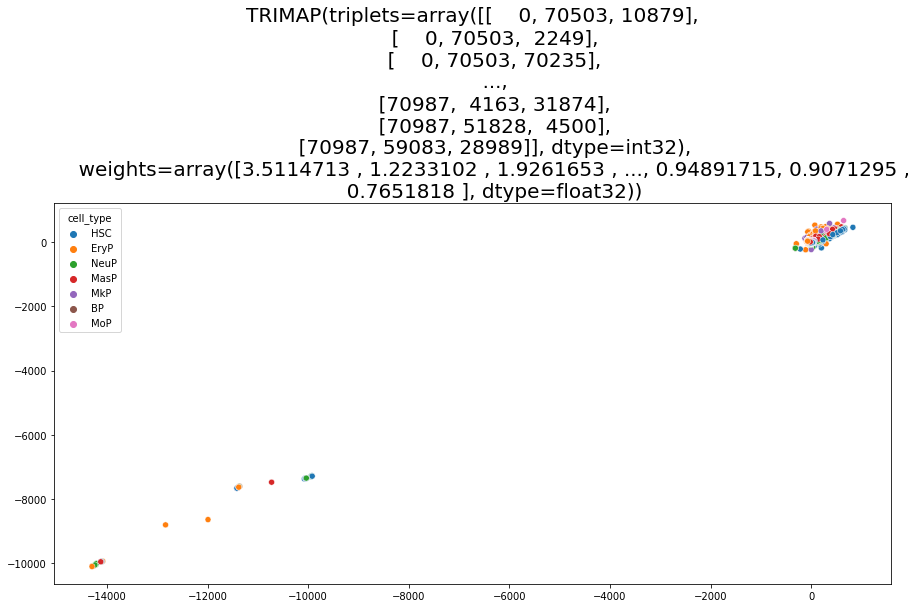

In [96]:

reducer =  trimap.TRIMAP() #  umap.UMAP()

t0 = time.time()
r = reducer.fit_transform(X)
print(time.time()-t0, 'secs passed for dimension reduction')


fig = plt.figure(figsize = (15,7) )
# c = 0
# for f in ['cp_dose', 'cp_type','cp_time','y_sum']:
#     c+=1; fig.add_subplot(1, 4 , c) 
sns.scatterplot(x=r[:,0], y=r[:,1]  , hue = d[column4color]  )
plt.title(str(reducer), fontsize = 20 )

plt.show()

# NCVis - similar to UMAP, bust faster (from Skolkovo team)

In [97]:
!pip install ncvis
import ncvis

39.143162965774536

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When

 secs passed for dimension reduction


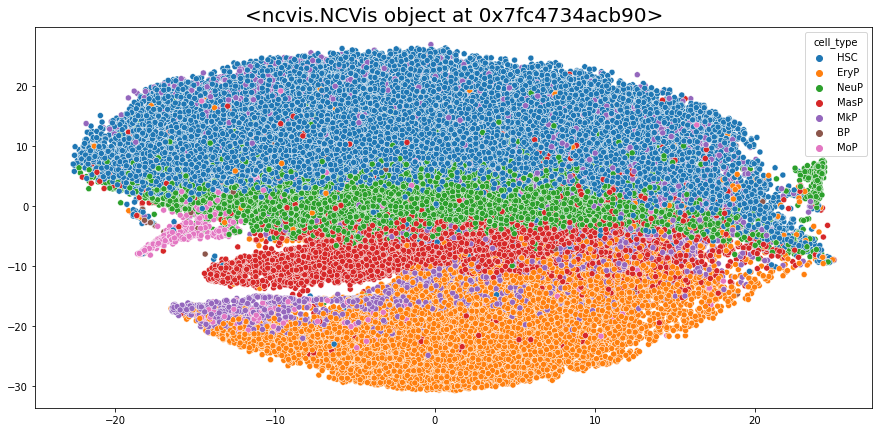

In [98]:
reducer =  ncvis.NCVis() # trimap.TRIMAP() #  umap.UMAP()

t0 = time.time()
r = reducer.fit_transform(X)
print(time.time()-t0, 'secs passed for dimension reduction')


fig = plt.figure(figsize = (15,7) )
# c = 0
# for f in ['cp_dose', 'cp_type','cp_time','y_sum']:
#     c+=1; fig.add_subplot(1, 4 , c) 
sns.scatterplot(x=r[:,0], y=r[:,1]  , hue = d[column4color]  )
plt.title(str(reducer), fontsize = 20 )
plt.show()

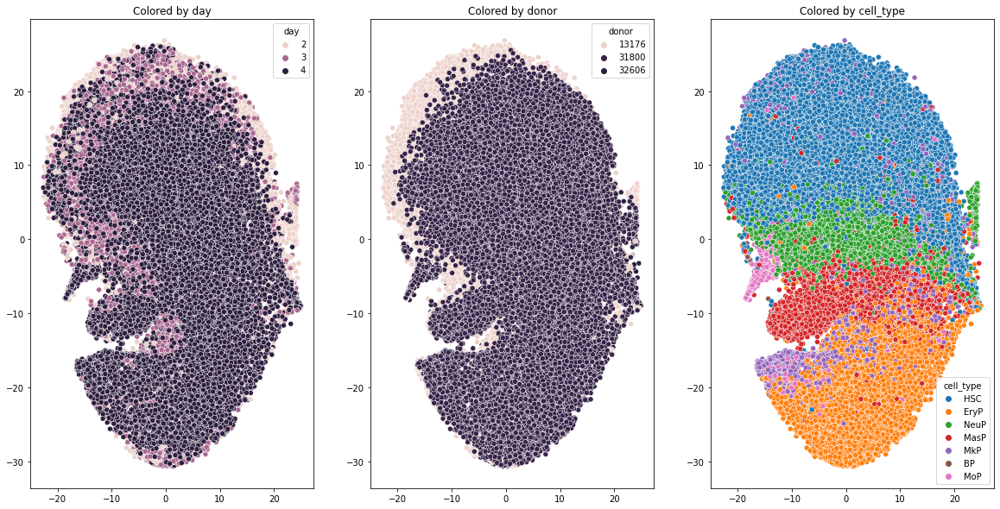

In [99]:
fig = plt.figure(figsize = (20,10) )
c = 0
for f in ['day', 'donor', 'cell_type']:# , 'technology']:
    c+=1; fig.add_subplot(1, 3 , c) 
    sns.scatterplot(x=r[:,0], y=r[:,1] , hue = d[f]  )
    plt.title('Colored by '+f)
plt.show()


    MasP = Mast Cell Progenitor
    MkP = Megakaryocyte Progenitor
    NeuP = Neutrophil Progenitor
    MoP = Monocyte Progenitor
    EryP = Erythrocyte Progenitor
    HSC = Hematoploetic Stem Cell
    BP = B-Cell Progenitor

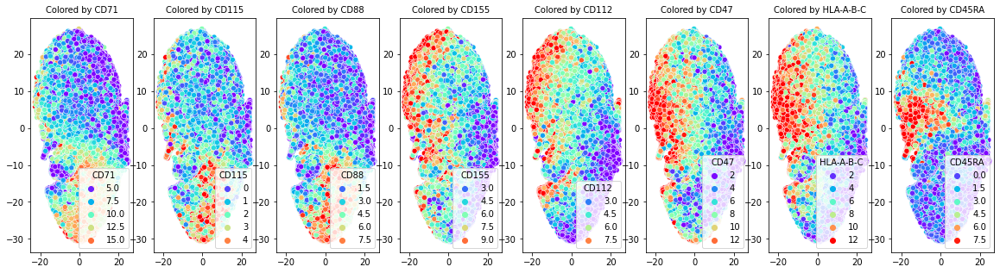

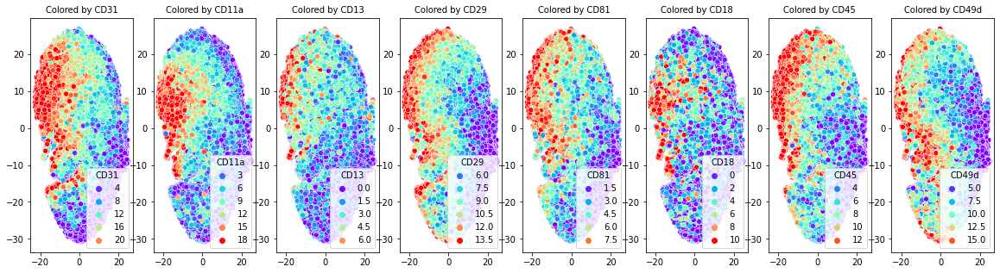

72.23119163513184 secs passed


In [100]:
# 0.7 correlation_threshold 
# Top 5 cluster sizes: [3 2 1 1 1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD71' 'CD115' 'CD88']

# 0.6 correlation_threshold 
# Top 5 cluster sizes: [14  5  2  1  1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD155' 'CD112' 'CD47' 'HLA-A-B-C' 'CD45RA' 'CD31' 'CD11a' 'CD13' 'CD29'
#  'CD81' 'CD18' 'CD45' 'CD49d' 'CD162']

import numbers

n_x_subplots = 8
palette = 'rainbow'#'viridis'

t0 = time.time()

c = 0
for f in ['CD71', 'CD115' ,'CD88'] + ['CD155', 'CD112', 'CD47', 'HLA-A-B-C' ,'CD45RA' ,'CD31' ,'CD11a', 'CD13', 'CD29',
  'CD81', 'CD18', 'CD45', 'CD49d']:# , 'CD162']: # ['day', 'donor', 'cell_type']:# , 'technology']:
    if c % n_x_subplots == 0:
        if c > 0:
            plt.show()
        fig = plt.figure(figsize = (20,5) ); c = 0
        #plt.suptitle(str(k),fontsize = 20 )# str_data_inf + ' n_cells: ' +str(mask.sum()) + ' RED > median expression, BLUE <= median ' )# +' ' + cell_type +' ' + drug )
        
    c += 1; fig.add_subplot(1,n_x_subplots ,c)    
    
    v = d[f]
    if isinstance(v[0], numbers.Number):
        v = np.clip(v,np.percentile(v,5), np.percentile(v,95) )
        # v = (v > np.median(v)).astype(int)
    ax = sns.scatterplot(x=r[:,0], y=r[:,1] , hue =  v , palette = palette )
    plt.setp(ax.get_legend().get_texts(), fontsize=10) # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize=10) # for legend title    
    plt.title('Colored by '+f, fontsize = 10)
    
plt.show()
print(time.time()-t0, 'secs passed')


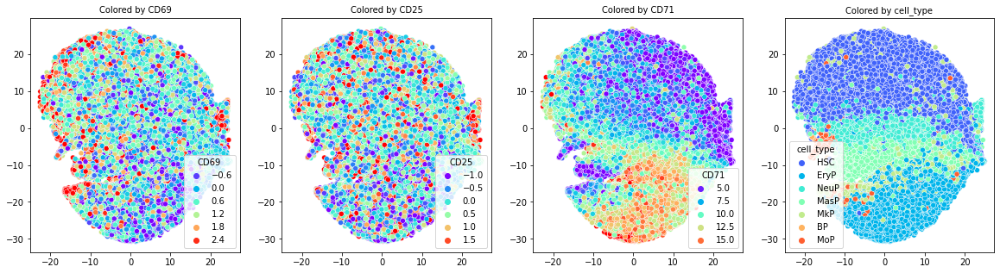

16.424362897872925 secs passed


In [104]:

# 0.7 correlation_threshold 
# Top 5 cluster sizes: [3 2 1 1 1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD71' 'CD115' 'CD88']

# 0.6 correlation_threshold 
# Top 5 cluster sizes: [14  5  2  1  1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD155' 'CD112' 'CD47' 'HLA-A-B-C' 'CD45RA' 'CD31' 'CD11a' 'CD13' 'CD29'
#  'CD81' 'CD18' 'CD45' 'CD49d' 'CD162']

# CD69 экспрессируется в Т клетках после активации. После этого они пролиферируют. Так же могут быть интересны CD25 и CD71

# https://link.springer.com/article/10.1007/BF01305907
    
import numbers

n_x_subplots = 4
palette = 'rainbow'#'viridis'

t0 = time.time()

c = 0
for f in ['CD69', 'CD25' ,'CD71','cell_type']:# , 'CD162']: # ['day', 'donor', 'cell_type']:# , 'technology']:
    if c % n_x_subplots == 0:
        if c > 0:
            plt.show()
        fig = plt.figure(figsize = (20,5) ); c = 0
        #plt.suptitle(str(k),fontsize = 20 )# str_data_inf + ' n_cells: ' +str(mask.sum()) + ' RED > median expression, BLUE <= median ' )# +' ' + cell_type +' ' + drug )
        
    c += 1; fig.add_subplot(1,n_x_subplots ,c)    
    
    v = d[f]
    if isinstance(v[0], numbers.Number):
        v = np.clip(v,np.percentile(v,5), np.percentile(v,95) )
        # v = (v > np.median(v)).astype(int)
    ax = sns.scatterplot(x=r[:,0], y=r[:,1] , hue =  v , palette = palette )
    plt.setp(ax.get_legend().get_texts(), fontsize=10) # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize=10) # for legend title    
    plt.title('Colored by '+f, fontsize = 10)
    
plt.show()
print(time.time()-t0, 'secs passed')


    MasP = Mast Cell Progenitor
    MkP = Megakaryocyte Progenitor
    NeuP = Neutrophil Progenitor
    MoP = Monocyte Progenitor
    EryP = Erythrocyte Progenitor
    HSC = Hematoploetic Stem Cell
    BP = B-Cell Progenitor

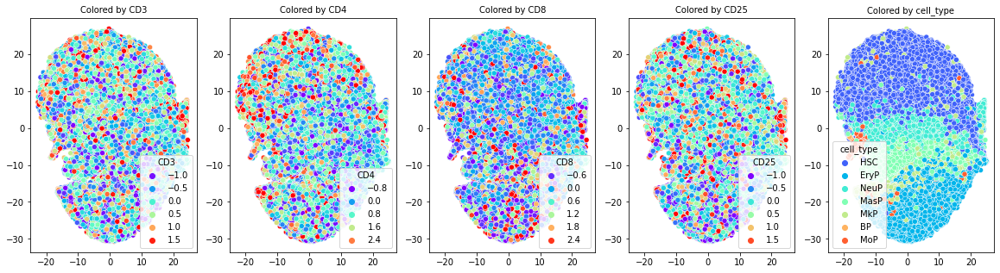

19.901955127716064 secs passed


In [106]:

# 0.7 correlation_threshold 
# Top 5 cluster sizes: [3 2 1 1 1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD71' 'CD115' 'CD88']

# 0.6 correlation_threshold 
# Top 5 cluster sizes: [14  5  2  1  1] seconds passed: 0.0
# 50 Genes in largest correlated group:
# ['CD155' 'CD112' 'CD47' 'HLA-A-B-C' 'CD45RA' 'CD31' 'CD11a' 'CD13' 'CD29'
#  'CD81' 'CD18' 'CD45' 'CD49d' 'CD162']

# CD69 экспрессируется в Т клетках после активации. После этого они пролиферируют. Так же могут быть интересны CD25 и CD71

# https://link.springer.com/article/10.1007/BF01305907
    
import numbers

n_x_subplots = 5
palette = 'rainbow'#'viridis'

t0 = time.time()

c = 0
for f in ['CD3', 'CD4', 'CD8', 'CD25','cell_type']: #  ['CD69', 'CD25' ,'CD71','cell_type']:# , 'CD162']: # ['day', 'donor', 'cell_type']:# , 'technology']:
    if f not in d.columns: continue 
    if c % n_x_subplots == 0:
        if c > 0:
            plt.show()
        fig = plt.figure(figsize = (20,5) ); c = 0
        #plt.suptitle(str(k),fontsize = 20 )# str_data_inf + ' n_cells: ' +str(mask.sum()) + ' RED > median expression, BLUE <= median ' )# +' ' + cell_type +' ' + drug )
        
    c += 1; fig.add_subplot(1,n_x_subplots ,c)    
    
    v = d[f]
    if isinstance(v[0], numbers.Number):
        v = np.clip(v,np.percentile(v,5), np.percentile(v,95) )
        # v = (v > np.median(v)).astype(int)
    ax = sns.scatterplot(x=r[:,0], y=r[:,1] , hue =  v , palette = palette )
    plt.setp(ax.get_legend().get_texts(), fontsize=10) # for legend text
    plt.setp(ax.get_legend().get_title(), fontsize=10) # for legend title    
    plt.title('Colored by '+f, fontsize = 10)
    
plt.show()
print(time.time()-t0, 'secs passed')
